# Retrieval Benchmark
Evaluate Recall@8 on 200 dev samples.

In [1]:
try:
    import finrag, jsonlines, openai
except ImportError as e:
    raise RuntimeError(
        "Missing dependencies – activate .venv‑notebook and run pip install -r requirements-notebook.txt"
    ) from e

In [2]:
import json, random, os, sys
sys.path.insert(0, os.path.abspath("src"))

from finrag.chunk_utils import build_candidate_chunks
from finrag.retriever import retrieve_evidence
from finrag.embeddings import EmbeddingStore

import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# Load only entries with QA, limit to 20 for demo speed
with open("data/dev_turn.json") as f:
    raw = json.load(f)
data = [e for e in raw if "qa" in e]

random.seed(42)
samples = random.sample(data, min(20, len(data)))

In [4]:
# Precompute + cache every chunk embedding once
store = EmbeddingStore()

# build candidate chunks for each sample
all_chunks = [build_candidate_chunks(s) for s in samples]
# collect unique texts
all_texts = {c["text"] for chunks in all_chunks for c in chunks}

# batch‑fetch missing embeddings in one API call
store.get_embeddings(list(all_texts))

[[-8.92259122338146e-05,
  -0.01083214022219181,
  0.004840675741434097,
  -0.014090480282902718,
  -0.014879975467920303,
  -0.01239105872809887,
  -0.029519088566303253,
  -0.002124277176335454,
  -0.016847023740410805,
  -0.01026343647390604,
  0.012504799291491508,
  0.012290699407458305,
  0.004997905343770981,
  -0.022708021104335785,
  0.008711208589375019,
  0.03010786511003971,
  0.01244458369910717,
  -0.02088816650211811,
  -0.0007890769629739225,
  -0.007379772141575813,
  -0.0440511517226696,
  0.0023216509725898504,
  -0.023096077144145966,
  -0.008463655598461628,
  -0.003104455303400755,
  -0.00035104932612739503,
  0.0006540097529068589,
  -0.01869363896548748,
  0.009092574939131737,
  -0.005871033761650324,
  0.0041348133236169815,
  0.002166093559935689,
  -0.025772331282496452,
  -0.026655495166778564,
  -0.022065719589591026,
  -0.019550040364265442,
  -0.005780709907412529,
  -0.017489323392510414,
  0.0027414883952587843,
  -0.00019361029262654483,
  0.018947882

In [5]:
hits, recalls, failed_ids = [], [], []

for sample, chunks in zip(samples, all_chunks):
    ann = sample["qa"]
    preds = retrieve_evidence(sample, ann["question"], top_k=10)

    gold = ["table:row:" + str(i) for i in ann.get("ann_table_rows", [])]
    gold += ["text:pre:" + str(i) for i in ann.get("ann_text_rows", [])]

    if gold:
        inter = set(gold) & set(preds)
        rec = len(inter) / len(gold)
        recalls.append(rec)
        hits.append(1 if inter else 0)
        if not inter:
            failed_ids.append(sample["id"])

In [6]:
# Total Recall@8
print(f'Recall@8: {sum(hits)}/{len(hits)} = {sum(hits)/len(hits):.3f}')

Recall@8: 15/20 = 0.750


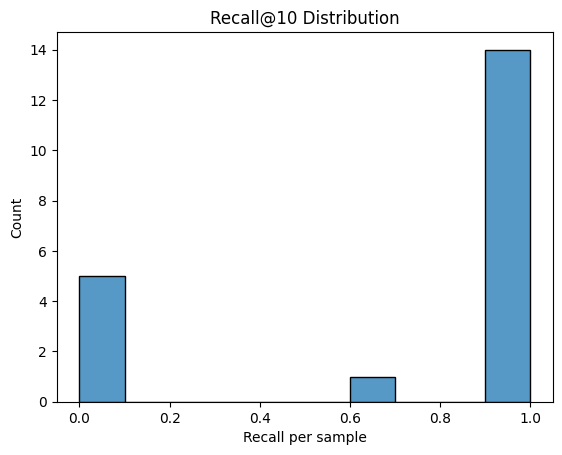

In [7]:
# Histogram of per-sample recall
sns.histplot(recalls, bins=10)
plt.xlabel('Recall per sample')
plt.ylabel('Count')
plt.title('Recall@10 Distribution')
plt.show()

In [8]:
# List failed sample IDs
print('Failed samples:', failed_ids)

Failed samples: ['Single_CB/2010/page_88.pdf-1_4', 'Single_AES/2015/page_117.pdf-3_0', 'Single_AES/2017/page_175.pdf-3_2', 'Single_APD/2016/page_96.pdf-1_1', 'Single_BLL/2007/page_47.pdf-1_0']
